# Neural Radiance Fields

(NeRF). After being introduced by Mildenhall et al. in 2020 [1], their seminal work was followed by a cornucopia of papers expanding on the idea in a multitude of directions.

## 0. Install and Import modules
Ensure `torch` and `torchvision` are installed. If `pytorch3d` is not installed, install it using the following cell:

In [ ]:
import os
import sys
import torch
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    if torch.__version__.startswith("1.7") and sys.platform.startswith("linux"):
        # We try to install PyTorch3D via a released wheel.
        version_str="".join([
            f"py3{sys.version_info.minor}_cu",
            torch.version.cuda.replace(".",""),
            f"_pyt{torch.__version__[0:5:2]}"
        ])
        !pip install pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
    else:
        # We try to install PyTorch3D from source.
        !curl -LO https://github.com/NVIDIA/cub/archive/1.10.0.tar.gz
        !tar xzf 1.10.0.tar.gz
        os.environ["CUB_HOME"] = os.getcwd() + "/cub-1.10.0"
        !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

In [ ]:
# %matplotlib inline
# %matplotlib notebook
import os
import sys
import time
import json
import glob
import torch
import math
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from IPython import display
from tqdm.notebook import tqdm

# Data structures and functions for rendering
from pytorch3d.structures import Volumes
from pytorch3d.transforms import so3_exponential_map
from pytorch3d.renderer import (
    FoVPerspectiveCameras,
    NDCGridRaysampler,
    MonteCarloRaysampler,
    EmissionAbsorptionRaymarcher,
    ImplicitRenderer,
    RayBundle,
    ray_bundle_to_ray_points,
)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
torch.cuda.set_device(device)
print(device)

cuda:0


# Part 1 - The most basic NeRF

To start off we will take a look at the basic formulation of Neural Radiance Fields.  You donot have to start from scratch but should instead use a library like Facebook’sPyTorch3D2which provides simple raymarching and implicit rendering functionality out-of-the-box.  Thefollowing tasks will closely follow the PyTorch3D tutorial for NeRFs3.  Feel free to use it asa basis for your solution, but note that we deviate a bit from it in this part.Fig.  1 highlights the components we need to implement a NeRF: Methods for raysamplingin a volume, an MLP that takes (view-dependent) coordinates and outputs emitted radianceand density at these coordinates, a volumetric renderer, and an appropriate loss function foroptimizing the MLP parameters.  Our first version will not contain view-dependent colors orpositional encoding.

## Task a)

Download  and  import  the  provided  training  datacow.zip.    It  consists  of  imagesand their respective camera poses during capture.  You should be able to load bothcameras.pkl(aFoVPerspectiveCamerasobject) andimages.pkl(atorch.Tensorobject) using Python’s built-inpicklemodule.

In [ ]:
import pickle

with open('cow/cameras.pkl', 'rb') as input:
    target_cameras = pickle.load(input)

with open('cow/images.pkl', 'rb') as input:
    target_images = pickle.load(input)
print("Loaded {} images/cameras.".format(len(target_images)))


Loaded 40 images/cameras.


## Task b)

In the next steps, we focus on generating images of a scene from a certain view basedon  volumetric  rendering.   Setup  two  separate  volumetric  renderers:  One  for  render-ing whole output images (“gridsampler”) and one that randomly samples rays frompixels of an image (“Monte Carlo sampler”).  The main difference is how the raysam-pling  is  executed.   PyTorch3D  provides  these  samplers  asNDCGridRaysamplerandMonteCarloRaysampler.  The renderer itself is calledImplicitRenderer.  Check thePyTorch3D tutorial for details on how to choose the parameters.

In [ ]:
# render_size describes the size of both sides of the
# rendered images in pixels. Since an advantage of
# Neural Radiance Fields are high quality renders
# with a significant amount of details, we render
# the implicit function at double the size of
# target images.
render_size = target_images.shape[1] * 2

# Our rendered scene is centered around (0,0,0)
# and is enclosed inside a bounding box
# whose side is roughly equal to 3.0 (world units).
volume_extent_world = 3.0

# 1) Instantiate the raysamplers.

# Here, NDCGridRaysampler generates a rectangular image
# grid of rays whose coordinates follow the PyTorch3D
# coordinate conventions.
raysampler_grid = NDCGridRaysampler(
    image_height=render_size,
    image_width=render_size,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world,
)

# MonteCarloRaysampler generates a random subset
# of `n_rays_per_image` rays emitted from the image plane.
raysampler_mc = MonteCarloRaysampler(
    min_x = -1.0,
    max_x = 1.0,
    min_y = -1.0,
    max_y = 1.0,
    n_rays_per_image=750,
    n_pts_per_ray=128,
    min_depth=0.1,
    max_depth=volume_extent_world,
)

# 2) Instantiate the raymarcher.
# Here, we use the standard EmissionAbsorptionRaymarcher
# which marches along each ray in order to render
# the ray into a single 3D color vector
# and an opacity scalar.
raymarcher = EmissionAbsorptionRaymarcher()

# Finally, instantiate the implicit renders
# for both raysamplers.
renderer_grid = ImplicitRenderer(
    raysampler=raysampler_grid, raymarcher=raymarcher,
)
renderer_mc = ImplicitRenderer(
    raysampler=raysampler_mc, raymarcher=raymarcher,
)

## Task c)

Create the MLP, that represents the scene, as a newtorch.nn.Module. We will greatlyreduce the number of parameters compared to [1] to be able to run the code on a morereasonable GPU. The MLP will consist of 3 elements:

*   A 3-layer encoder MLP that converts the 3D input of xyz-coordinates into a 256-dim.  latent representation.  The first layer should have 360 neurons, followed bytwo layers with 256 neurons each.  Use a softplus activation function with $\beta = 10$ after each layer.

*   A 2-layer MLP that takes the latent representation and outputs an RGB colorvalue.  The first layer should again use softplus as before.  To ensure that colorvalues are in [0,1], use the sigmoid activation after the second layer.

*   A single dense layer that predicts the density given the latent representation. Hereyou can again use softplus as before and map the values to [0,1] by computingy= 1−e−x, wherexis the raw density andy∈[0,1] is the mapped value.  Toensure that opacities are initialized close to zero, you have to set the bias of thislayer to−1.5 before training starts4.

Theforwardfunction should return density and color at given xyz-locations.  To becompatible to theImplicitRenderer, you should expect the input of the function to betorch3d.renderer.RayBundleobjects.  The renderer will use keyword arguments, soyour signature should look like this:


```
def forward(self, ray_bundle, **kwargs):...
```

You   can   extract   the   xyz-coordinates   from   theRayBundleobjects   using   theraybundletoraypointsfunction found in thetorch3d.renderermodule.To  be  able  to  render  whole  images  on  a  machine  with  limited  GPU  memory,  youshould also consider creating abatchedforwardfunction for your MLP. Instead ofevaluating all ray points at once, it should create batches of points, evaluate the MLPfor each batch separately and concatenate the output afterwards.  Check out the Py-Torch3D tutorial if you are unsure on how to do this.  Also make sure that you usetorch.nograd()if you don’t need gradients.




In [ ]:
class NeuralRadianceField(torch.nn.Module):
    def __init__(self, n_hidden_neurons=256):
        super().__init__()

        input_dim = 3
        embedding_dim = 360

        # Embedding network: Accepts the input position and
        # returns a high-dimensional
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(input_dim, embedding_dim),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(embedding_dim, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0)
        )

        # Color network: Maps the high-dimensional embedding
        # of the position onto the color value for the given pixel
        self.color_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, n_hidden_neurons),
            torch.nn.Softplus(beta=10.0),
            torch.nn.Linear(n_hidden_neurons, 3),
            torch.nn.Sigmoid()
        )

        # Opacity network: Maps the high-dimensional embedding of the position
        # onto a opacity value for the given pixel
        self.density_layer = torch.nn.Sequential(
            torch.nn.Linear(n_hidden_neurons, 1),
            torch.nn.Softplus(beta=10.0)
        )

        # Initialize the density network's bias to be -1.5  in order to
        # initialize the opacities of the ray points to values close to 0.
        self.density_layer[0].bias.data[0] = -1.5

    def forward(self, ray_bundle: RayBundle, **kwargs):
        # We first convert the ray parametrizations to world
        # coordinates with `ray_bundle_to_ray_points`.
        rays_points_world = ray_bundle_to_ray_points(ray_bundle)
        # rays_points_world.shape = [minibatch x ... x 3]

        # For each 3D world coordinate, we obtain its harmonic embedding.
        #embeds = self.harmonic_embedding(rays_points_world )
        # embeds.shape = [minibatch x ... x self.n_harmonic_functions*6]

        # self.mlp maps each harmonic embedding to a latent feature space.
        features = self.mlp(rays_points_world)
        # features.shape = [minibatch x ... x n_hidden_neurons]

        # Finally, given the per-point features,
        # execute the density and color branches.

        # Ray density
        raw_densities = self.density_layer(features)
        rays_densities = 1 - torch.exp(-raw_densities)
        # rays_densities.shape = [minibatch x ... x 1]

        rays_colors = self.color_layer(features)
        #self._get_colors(features, ray_bundle.directions)
        # rays_colors.shape = [minibatch x ... x 3]

        return rays_densities, rays_colors

    def batched_forward(
        self,
        ray_bundle: RayBundle,
        n_batches: int = 16,
        **kwargs,
    ):

        # Parse out shapes needed for tensor reshaping in this function.
        n_pts_per_ray = ray_bundle.lengths.shape[-1]
        spatial_size = [*ray_bundle.origins.shape[:-1], n_pts_per_ray]

        # Split the rays to `n_batches` batches.
        tot_samples = ray_bundle.origins.shape[:-1].numel()
        batches = torch.chunk(torch.arange(tot_samples), n_batches)

        # For each batch, execute the standard forward pass.
        batch_outputs = [
            self.forward(
                RayBundle(
                    origins=ray_bundle.origins.view(-1, 3)[batch_idx],
                    directions=ray_bundle.directions.view(-1, 3)[batch_idx],
                    lengths=ray_bundle.lengths.view(-1, n_pts_per_ray)[batch_idx],
                    xys=None,
                )
            ) for batch_idx in batches
        ]

        # Concatenate the per-batch rays_densities and rays_colors
        # and reshape according to the sizes of the inputs.
        rays_densities, rays_colors = [
            torch.cat(
                [batch_output[output_i] for batch_output in batch_outputs], dim=0
            ).view(*spatial_size, -1) for output_i in (0, 1)
        ]
        return rays_densities, rays_colors

## Task d)

Next  up  you  have  to  implement  the  loss  function.   As  shown  in  Fig.   1,  we  willsimply  measure  the  difference  of  the  rendered  image  to  the  ground  truth.   To  sta-bilize  training,  the  PyTorch3D  tutorial  usesHuber  loss,  which  essentially  behaveslike  MSE  for  small  values  and  like  an  L1  loss  for  higher  values.   You  can  for  exam-ple  usetorch.nn.HuberLosswithδ=  0.1.   For  the  training  phase  we  will  use  theMonte Carlo renderer and therefore have to be able to sample the correct pixels fromthe  ground-truth  images  to  compare  it  in  the  loss  function.   You  can  just  copy  thesampleimagesatmclocsfunction from the PyTorch3D tutorial.

In [ ]:
def huber(x, y, scaling=0.1):
    """
    A helper function for evaluating the smooth L1 (huber) loss
    between the rendered silhouettes and colors.
    """
    diff_sq = (x - y) ** 2
    loss = ((1 + diff_sq / (scaling**2)).clamp(1e-3).sqrt() - 1) * float(scaling)
    return loss

def sample_images_at_mc_locs(target_images, sampled_rays_xy):
    """
    Given a set of Monte Carlo pixel locations `sampled_rays_xy`,
    this method samples the tensor `target_images` at the
    respective 2D locations.

    This function is used in order to extract the colors from
    ground truth images that correspond to the colors
    rendered using `MonteCarloRaysampler`.
    """
    ba = target_images.shape[0]
    dim = target_images.shape[-1]
    spatial_size = sampled_rays_xy.shape[1:-1]
    # In order to sample target_images, we utilize
    # the grid_sample function which implements a
    # bilinear image sampler.
    # Note that we have to invert the sign of the
    # sampled ray positions to convert the NDC xy locations
    # of the MonteCarloRaysampler to the coordinate
    # convention of grid_sample.
    images_sampled = torch.nn.functional.grid_sample(
        target_images.permute(0, 3, 1, 2),
        -sampled_rays_xy.view(ba, -1, 1, 2),  # note the sign inversion
        align_corners=True
    )
    return images_sampled.permute(0, 2, 3, 1).view(
        ba, *spatial_size, dim
    )

def show_full_render(
    neural_radiance_field, camera,
    target_image, target_silhouette,
    loss_history_color, loss_history_sil,
):
    """
    This is a helper function for visualizing the
    intermediate results of the learning.

    Since the `NeuralRadianceField` suffers from
    a large memory footprint, which does not let us
    render the full image grid in a single forward pass,
    we utilize the `NeuralRadianceField.batched_forward`
    function in combination with disabling the gradient caching.
    This chunks the set of emitted rays to batches and
    evaluates the implicit function on one batch at a time
    to prevent GPU memory overflow.
    """

    # Prevent gradient caching.
    with torch.no_grad():
        # Render using the grid renderer and the
        # batched_forward function of neural_radiance_field.
        rendered_image_silhouette, _ = renderer_grid(
            cameras=camera,
            volumetric_function=neural_radiance_field.batched_forward
        )
        # Split the rendering result to a silhouette render
        # and the image render.
        rendered_image, rendered_silhouette = (
            rendered_image_silhouette[0].split([3, 1], dim=-1)
        )

    # Generate plots.
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax = ax.ravel()
    clamp_and_detach = lambda x: x.clamp(0.0, 1.0).cpu().detach().numpy()
    ax[0].plot(list(range(len(loss_history_color))), loss_history_color, linewidth=1)
    ax[1].imshow(clamp_and_detach(rendered_image))
    ax[2].imshow(clamp_and_detach(rendered_silhouette[..., 0]))
    if loss_history_sil is not None:
      ax[3].plot(list(range(len(loss_history_sil))), loss_history_sil, linewidth=1)
    ax[4].imshow(clamp_and_detach(target_image))
    if target_silhouette is not None:
      ax[5].imshow(clamp_and_detach(target_silhouette))
    for ax_, title_ in zip(
        ax,
        (
            "loss color", "rendered image", "rendered silhouette",
            "loss silhouette", "target image",  "target silhouette",
        )
    ):
        if not title_.startswith('loss'):
            ax_.grid("off")
            ax_.axis("off")
        ax_.set_title(title_)
    fig.canvas.draw(); fig.show()
    display.clear_output(wait=True)
    display.display(fig)
    return fig


## Task e)

Finally, we can implement the training loop.  Use an Adam optimizer with an initiallearning rate of 10−4.  In each iteration of the training you should

*    sample a small batch of image-camera pairs,
*    use the Monte Carlo renderer to retrieve pixel values and the corresponding sam-pled rays,
*    compute the mean Huber loss between rendered and ground-truth color values,*    backpropagate the loss and take one gradient descent step.

You should also add some logging and visualization in regular intervals to monitor the convergence of the NeRF. The training will probably require a few thousands of epochsto show some recognizable results.

In [ ]:
def optimize_radiance_field(neural_radiance_field, verbose = True):
  # First move all relevant variables to the correct device.
  global renderer_grid, renderer_mc, target_cameras, target_images
  renderer_grid = renderer_grid.to(device)
  renderer_mc = renderer_mc.to(device)
  target_cameras = target_cameras.to(device)
  target_images = target_images.to(device)

  # Set the seed for reproducibility
  torch.manual_seed(1)

  # We sample 6 random cameras in a minibatch. Each camera
  # emits raysampler_mc.n_pts_per_image rays.
  batch_size = 6

  # 3000 iterations take ~20 min on a Tesla M40 and lead to
  # reasonably sharp results. However, for the best possible
  # results, we recommend setting n_iter=20000.
  n_iter = 3000

  # Instantiate the Adam optimizer. We set its master learning rate to 1e-3.
  lr = 1e-4
  optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)
  scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=int(0.75*n_iter), gamma=0.1)

  # Init the loss history buffers.
  loss_history = []

  # The main optimization loop.
  start = time.time()
  for iteration in range(n_iter):
    # In case we reached the last 75% of iterations,
    # decrease the learning rate of the optimizer 10-fold.
    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(
            neural_radiance_field.parameters(), lr=lr * 0.1
        )

    # Zero the optimizer gradient.
    optimizer.zero_grad()

    # Sample random batch indices.
    batch_idx = torch.randperm(len(target_cameras))[:batch_size]

    # Sample the minibatch of cameras.
    batch_cameras = FoVPerspectiveCameras(
        R = target_cameras.R[batch_idx],
        T = target_cameras.T[batch_idx],
        znear = target_cameras.znear[batch_idx],
        zfar = target_cameras.zfar[batch_idx],
        aspect_ratio = target_cameras.aspect_ratio[batch_idx],
        fov = target_cameras.fov[batch_idx],
        device = device,
    )

    # Evaluate the nerf model.
    rendered_images_silhouettes, sampled_rays = renderer_mc(
        cameras=batch_cameras,
        volumetric_function=neural_radiance_field
    )
    rendered_images, rendered_silhouettes = (
        rendered_images_silhouettes.split([3, 1], dim=-1)
    )

    # Compute the color error as the mean huber
    # loss between the rendered colors and the
    # sampled target images.
    colors_at_rays = sample_images_at_mc_locs(
        target_images[batch_idx],
        sampled_rays.xys
    )
    loss = huber(
        rendered_images,
        colors_at_rays,
    ).abs().mean()

    # Take the optimization step.
    loss.backward()
    optimizer.step()

    # Log the loss history.
    loss_history.append(loss.item())

    # Every 10 iterations, print the current values of the losses.
    if iteration % 10 == 0 and verbose:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {loss.item():1.2e}'
        )

    # Visualize the full renders every 100 iterations.
    if iteration % 100 == 0 and verbose:
        show_idx = torch.randperm(len(target_cameras))[:1]
        show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R = target_cameras.R[show_idx],
                T = target_cameras.T[show_idx],
                znear = target_cameras.znear[show_idx],
                zfar = target_cameras.zfar[show_idx],
                aspect_ratio = target_cameras.aspect_ratio[show_idx],
                fov = target_cameras.fov[show_idx],
                device = device,
            ),
            target_images[show_idx][0],
            None,
            loss_history,
            None
        )

  end = time.time()
  print(f"NeRF optimization finished in {end - start} seconds")

def _experiment():
  basic_nerf = NeuralRadianceField().to(device)
  optimize_radiance_field(basic_nerf)

## Task f)

Render some images of your resulting radiance field.  For simplicity you may use thegeneraterotatingnerffunction from the PyTorch3D tutorial.

In [ ]:
def image_grid(
    images,
    rows=None,
    cols=None,
    fill: bool = True,
    show_axes: bool = False,
    rgb: bool = True,
):
    """
    A util function for plotting a grid of images.
    Args:
        images: (N, H, W, 4) array of RGBA images
        rows: number of rows in the grid
        cols: number of columns in the grid
        fill: boolean indicating if the space between images should be filled
        show_axes: boolean indicating if the axes of the plots should be visible
        rgb: boolean, If True, only RGB channels are plotted.
            If False, only the alpha channel is plotted.
    Returns:
        None
    """
    if (rows is None) != (cols is None):
        raise ValueError("Specify either both rows and cols or neither.")

    if rows is None:
        rows = len(images)
        cols = 1

    gridspec_kw = {"wspace": 0.0, "hspace": 0.0} if fill else {}
    fig, axarr = plt.subplots(rows, cols, gridspec_kw=gridspec_kw, figsize=(15, 9))
    bleed = 0
    fig.subplots_adjust(left=bleed, bottom=bleed, right=(1 - bleed), top=(1 - bleed))

    for ax, im in zip(axarr.ravel(), images):
        if rgb:
            # only render RGB channels
            ax.imshow(im[..., :3])
        else:
            # only render Alpha channel
            ax.imshow(im[..., 3])
        if not show_axes:
            ax.set_axis_off()

def generate_rotating_nerf(neural_radiance_field, n_frames = 50):
    logRs = torch.zeros(n_frames, 3, device=device)
    logRs[:, 1] = torch.linspace(-3.14, 3.14, n_frames, device=device)
    Rs = so3_exponential_map(logRs)
    Ts = torch.zeros(n_frames, 3, device=device)
    Ts[:, 2] = 2.7
    frames = []
    print('Rendering rotating NeRF ...')
    for R, T in zip(tqdm(Rs), Ts):
        camera = FoVPerspectiveCameras(
            R=R[None],
            T=T[None],
            znear=target_cameras.znear[0],
            zfar=target_cameras.zfar[0],
            aspect_ratio=target_cameras.aspect_ratio[0],
            fov=target_cameras.fov[0],
            device=device,
        )
        # Note that we again render with `NDCGridRaySampler`
        # and the batched_forward function of neural_radiance_field.
        frames.append(
            renderer_grid(
                cameras=camera,
                volumetric_function=neural_radiance_field.batched_forward,
            )[0][..., :3]
        )
    #return torch.cat(frames)
    rotating_nerf_frames = torch.cat(frames)
    image_grid(rotating_nerf_frames.clamp(0., 1.).cpu().numpy(), rows=3, cols=5, rgb=True, fill=True)
    plt.show()

def _experiment():
  with torch.no_grad():
    generate_rotating_nerf(basic_nerf, n_frames=3*5)

  del basic_nerf

# Part 2 - Positional Encoding and View Dependence

Your end result from Part 1 probably looks quite underwhelming.  This is mainly due to anadditional transformation that we have yet to introduce.  The authors of the NeRF paperfound  out  that  a  positional  encoding  of  the  coordinates  is  crucial  for  the  MLP  to  learnhigh-frequency variation in color and geometry.This encoding simply consists of a filtering of the coordinates $p \in \{x,y,z\}$ using a logarithmic scale of $L \in N$ frequencies with the fundamental frequency $\omega_0$:

> $\gamma(p) =(\sin(2^0\pi\omega_0p), \cos(2^0\pi\omega_0p),...,\sin(2^{L−1}\pi \omega_0p), \cos(2^{L−1}\pi \omega_0 p))$

## Task a)
Add the positional encoding to your solution.  One easy way to do this is to just take the coordinates you got from  ```ray_bundle_to_ray_points``` in the ```forward``` function of your MLP (see Part 1c) and apply $\gamma$ to each value. This encoding is then fed as inputto the MLP. Use $L= 60$ as a starting point for your experiments.




In [ ]:
class HarmonicEmbedding(torch.nn.Module):
    def __init__(self, harmonic_dim=60, omega0=0.1):
        super().__init__()

        self.register_buffer(
            'frequencies',
            omega0 * math.pi * (2.0 ** torch.arange(harmonic_dim)),
        )
    def forward(self, x):
      # bn, n_samples, n_points, 3 -> bn, n_samples, n_points, 3, 60
      scaled_frequencies = x[..., None] * self.frequencies

      # bn, n_samples, n_points, 3, 60 -> bn, n_samples, n_points, 180
      embedding = scaled_frequencies.view(*x.shape[:-1], -1)

      # bn, n_samples, n_points, 180 -> bn, n_samples, n_points, 360
      return torch.cat((embedding.sin(), embedding.cos()), dim=-1)

class PositionalNeRF(NeuralRadianceField):

  def __init__(self, harmonic_dim, hidden_dim = 256):
    super().__init__(hidden_dim)

    # The size of the embedded layer is  six times the
    # number of harmonic_dim because each of the 3 input
    # dims is encoded with two 60-dim vectors.
    embedding_dim = 6 * harmonic_dim

    # Smaller version of the encoder network. The learned
    # embedding is replaced by the harmonic embedding layer
    self.mlp = torch.nn.Sequential(
          HarmonicEmbedding(harmonic_dim),
          torch.nn.Linear(embedding_dim, hidden_dim),
          torch.nn.Softplus(beta=10.0),
          torch.nn.Linear(hidden_dim, hidden_dim),
          torch.nn.Softplus(beta=10.0)
    )

## Task b)

Setup a way to measure how fast an iteration / the whole training of your code takes. Rerun the training from Part 1f (without the positional encoding), measure the timingsand save some images of the final result. Then rerun the training with positional encoding enabled and compare convergence behavior,  visual fidelity and runtimes ofthe two training variants.

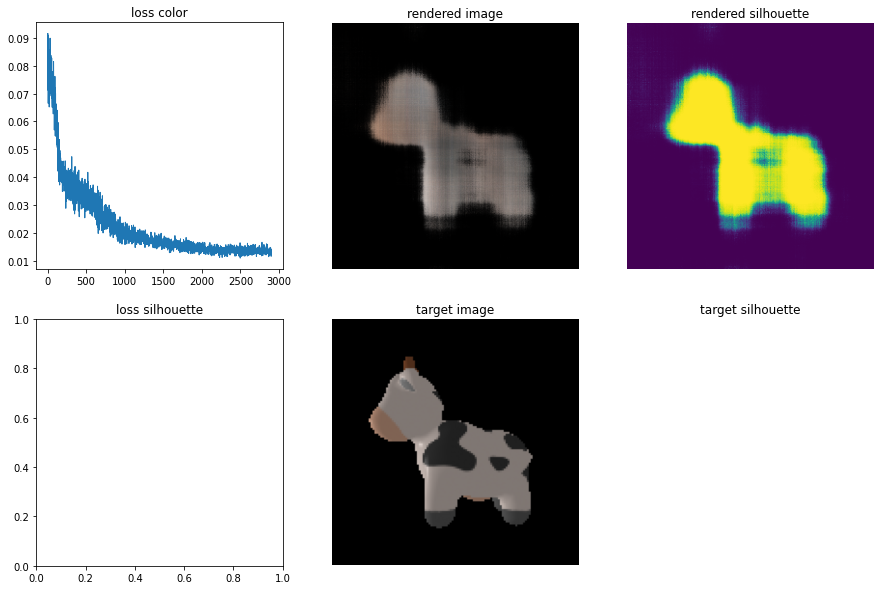

Iteration 02910: loss color = 1.23e-02
Iteration 02920: loss color = 1.46e-02
Iteration 02930: loss color = 1.38e-02
Iteration 02940: loss color = 1.34e-02
Iteration 02950: loss color = 1.35e-02
Iteration 02960: loss color = 1.44e-02
Iteration 02970: loss color = 1.29e-02
Iteration 02980: loss color = 1.41e-02
Iteration 02990: loss color = 1.65e-02
NeRF optimization finished in 1092.9102272987366 seconds
Rendering rotating NeRF ...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



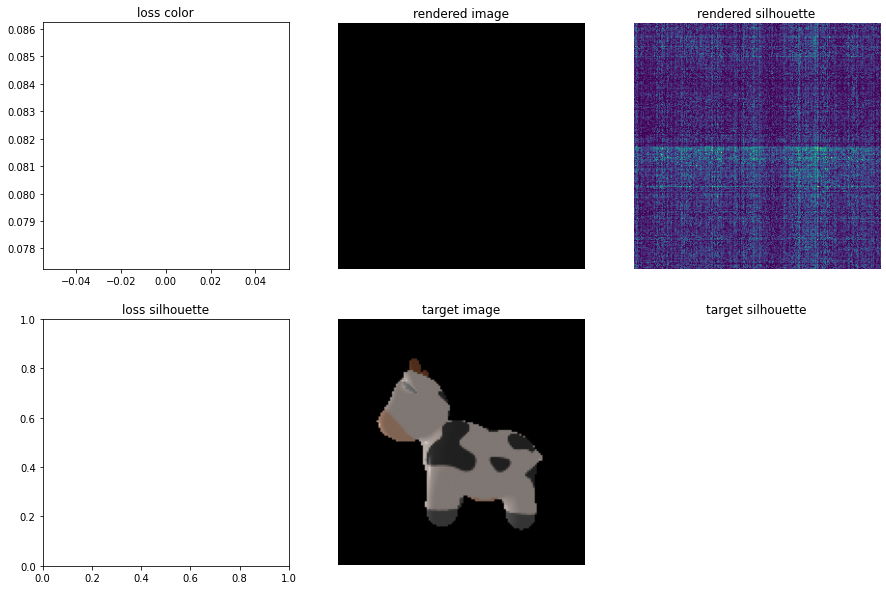

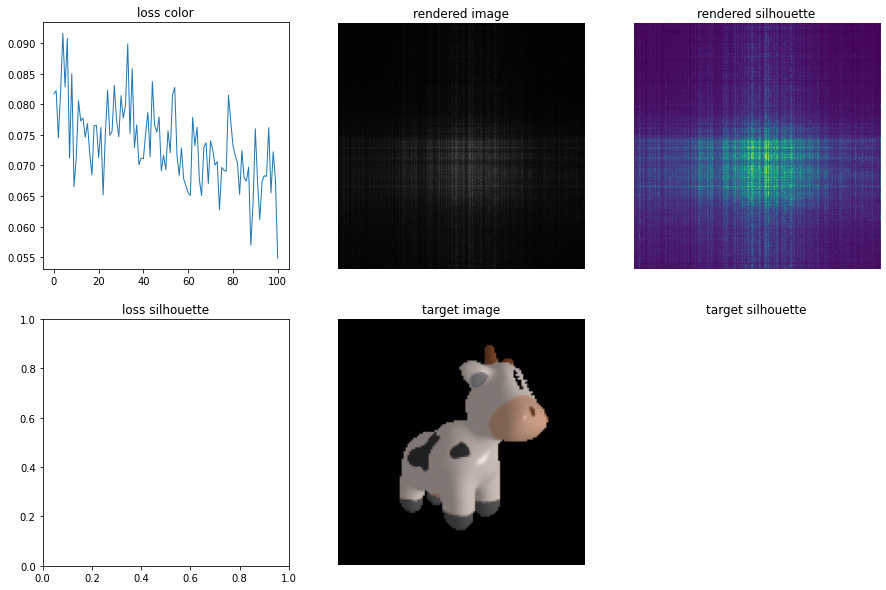

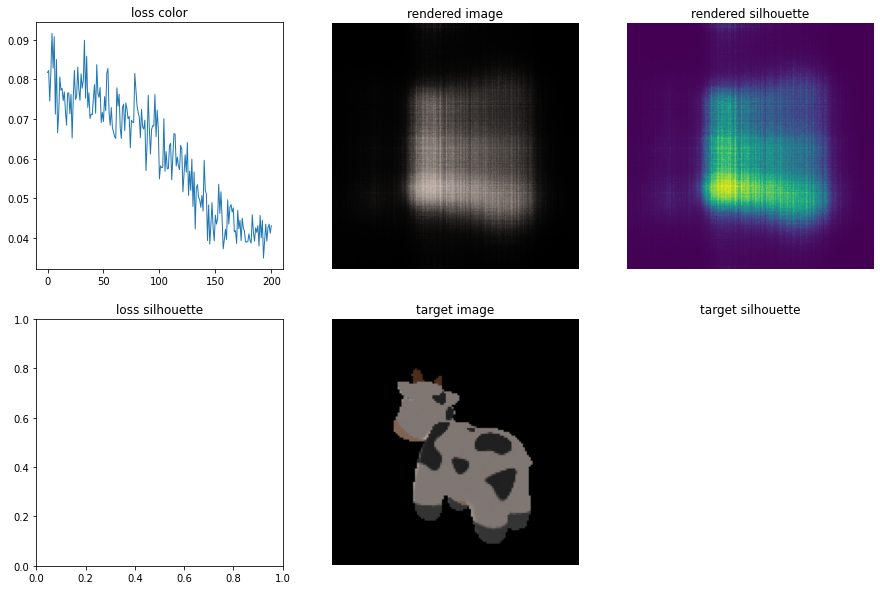

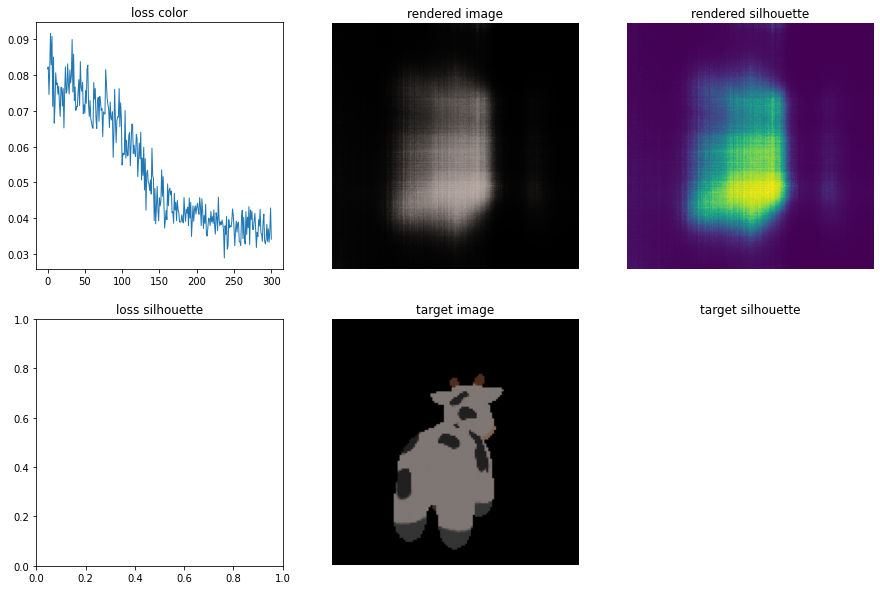

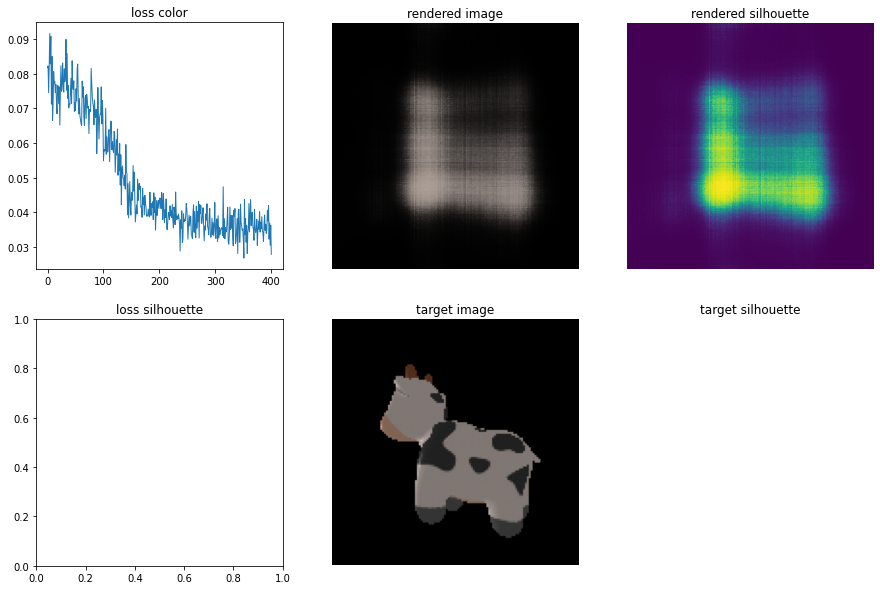

...

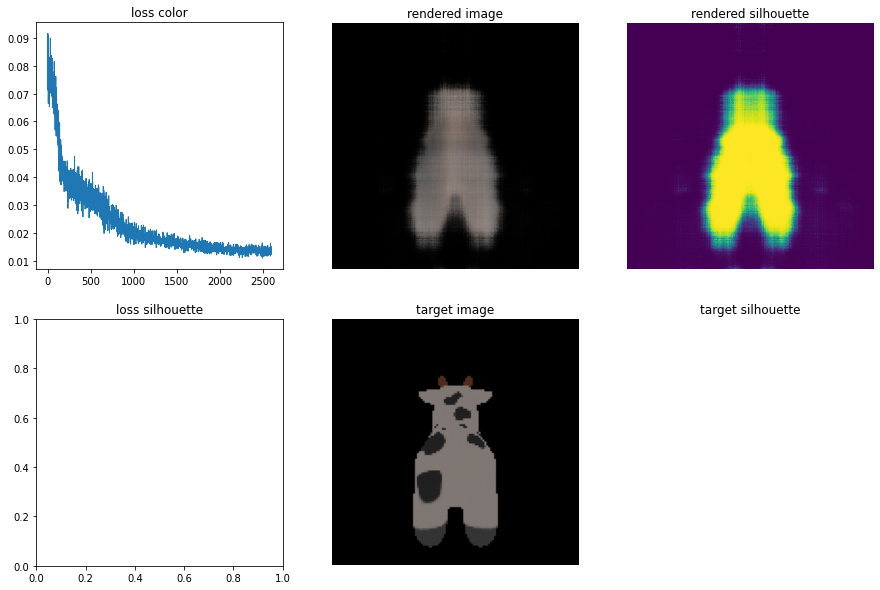

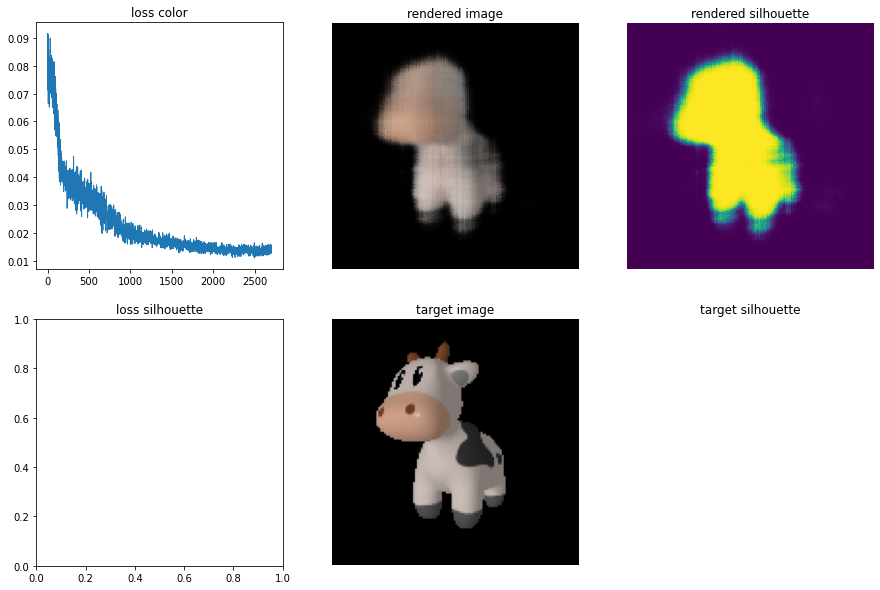

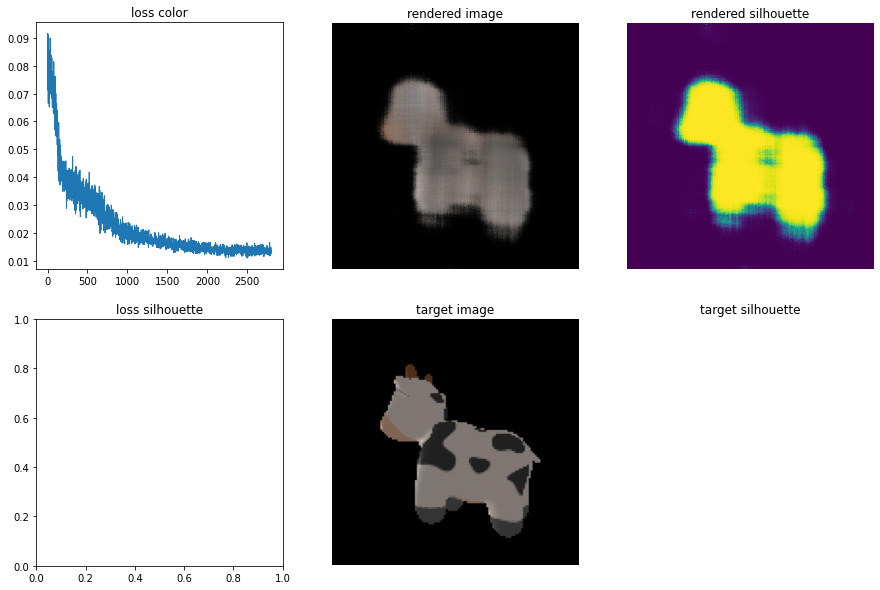

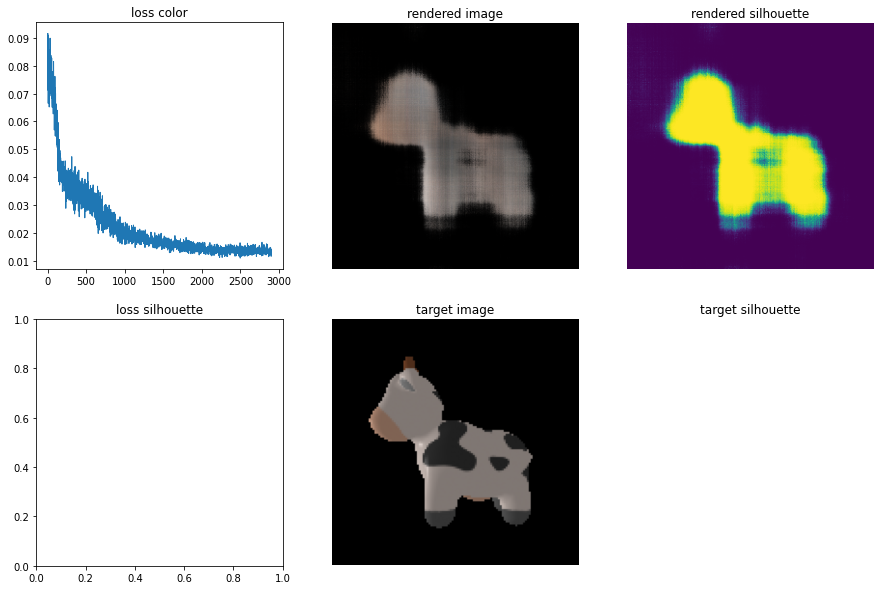

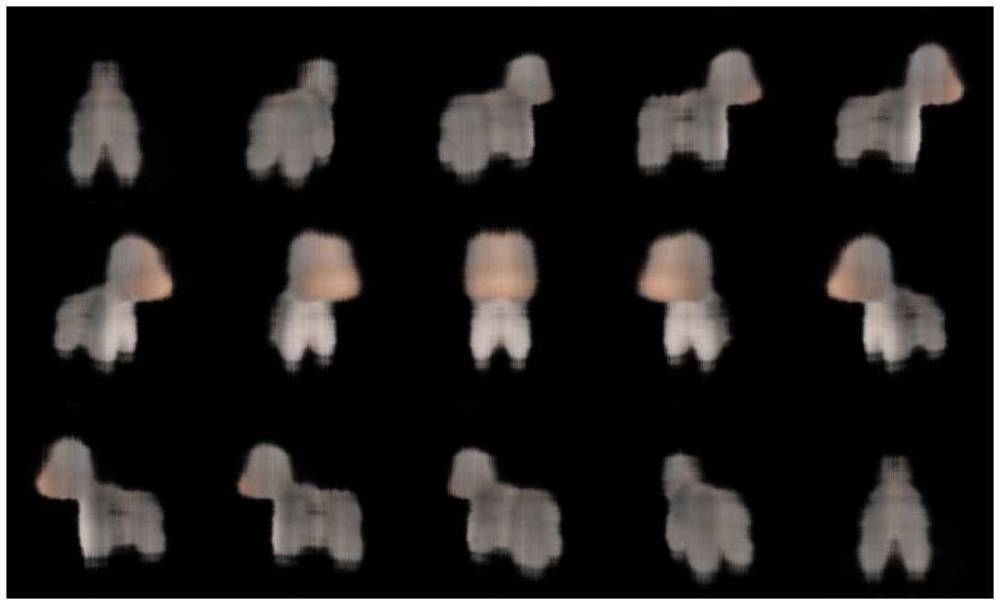

In [ ]:
def _experiment():
  positional_nerf = PositionalNeRF(60).to(device)
  optimize_radiance_field(positional_nerf)

  with torch.no_grad():
      generate_rotating_nerf(positional_nerf, n_frames=3*5)

  del positional_nerf

_experiment()

## Task c)

Now try to vary the hyperparameter $L$, e.g. choose $L = 10$, $L= 30$, $L= 100$ and compare the results to b). Instead of choosing fixed powers $0,1,...,L−1$, you can also try to draw the powers uniformly at random from $[0,L] \subset \mathbb{R}$.

In [ ]:
def _experiment():
  parameters = [10, 30, 100]
  for L in parameters:

    print(f"Optimizing NeRF with {L} harmonic functions...")
    hyperparameter_nerf = PositionalNeRF(L).to(device)
    optimize_radiance_field(hyperparameter_nerf, verbose=False)

    with torch.no_grad():
      rotating_nerf_frames = generate_rotating_nerf(hyperparameter_nerf, n_frames=3*5)

    del hyperparameter_nerf


# Task 2.1 - Directional encoding

One other crucial ingredient of NeRFs is still missing.  Up until now the colors only depend on the coordinates.  To increase fidelity, we will now introduce view-dependent colors into theMLP. Luckily, the a forementioned `RayBundleobjects` already have an attribute directions that contains an unnormalized 3D vector representing the direction for each ray in the bundle. To make use of this, you should

*   normalize the direction vectors,
*   encode them using $\gamma$, and
*   pass the encoded values to the color MLP.

For the last step you of course have to change the input size of the color MLP.

In [ ]:
class DirectionalEncoding(torch.nn.Module):

  def __init__(self, harmonic_dim):
    super().__init__()

    self.harmonic_embedding = HarmonicEmbedding(harmonic_dim)

  def forward(self, features, directions):

    normalized_directions = torch.nn.functional.normalize(
            directions,
            dim=-1,
    )

    embedding = self.harmonic_embedding(
        normalized_directions
    )

    spatial = features.shape[:-1]
    embedding = embedding[..., None, :].expand(
        *spatial,
        embedding.shape[-1]
    )

    return torch.cat([features, embedding], dim=-1)

class HarmonicNeRF(PositionalNeRF):

  def __init__(self, harmonic_dim, hidden_dim = 256):
    super().__init__(harmonic_dim, hidden_dim) # The problem last time was that is passed hidden_dim, and this 2**256 caused an inf!

    self.encoding = DirectionalEncoding(harmonic_dim)
    embedding_dim = 6* harmonic_dim

    self.color_layer = torch.nn.Sequential(
        torch.nn.Linear(hidden_dim+embedding_dim, hidden_dim),
        torch.nn.Softplus(beta=10.0),
        torch.nn.Linear(hidden_dim, 3),
        torch.nn.Sigmoid()
    )

  def forward(self, ray_bundle: RayBundle, **kwargs):
    rays_points_world = ray_bundle_to_ray_points(ray_bundle)

    # self.mlp maps each harmonic embedding to a latent feature space.
    features = self.mlp(rays_points_world)

    # Ray density
    raw_densities = self.density_layer(features)
    rays_densities = 1 - torch.exp(-raw_densities)

    color_inputs = self.encoding(features, ray_bundle.directions)
    rays_colors = self.color_layer(color_inputs)

    return rays_densities, rays_colors




## Task d)

Add view dependency to your code and rerun the training. Can you observe improvements in quality or convergence behavior?

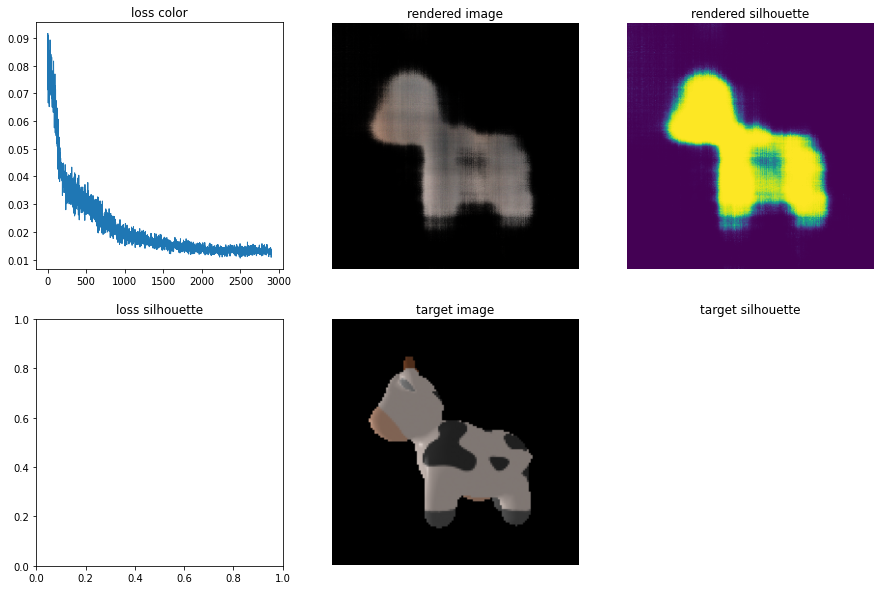

Iteration 02910: loss color = 1.21e-02
Iteration 02920: loss color = 1.39e-02
Iteration 02930: loss color = 1.34e-02
Iteration 02940: loss color = 1.30e-02
Iteration 02950: loss color = 1.31e-02
Iteration 02960: loss color = 1.38e-02
Iteration 02970: loss color = 1.27e-02
Iteration 02980: loss color = 1.36e-02
Iteration 02990: loss color = 1.64e-02
NeRF optimization finished in 1450.710476398468 seconds
Rendering rotating NeRF ...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



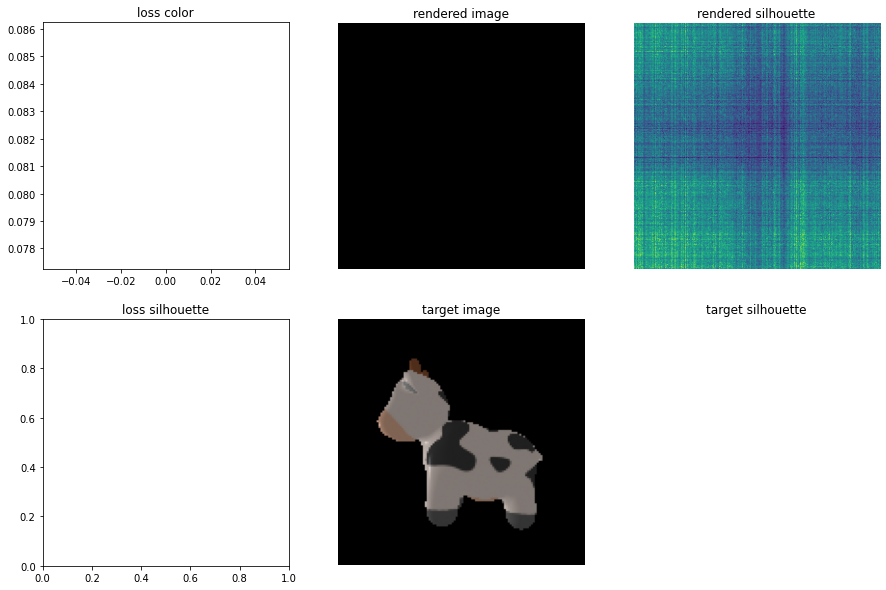

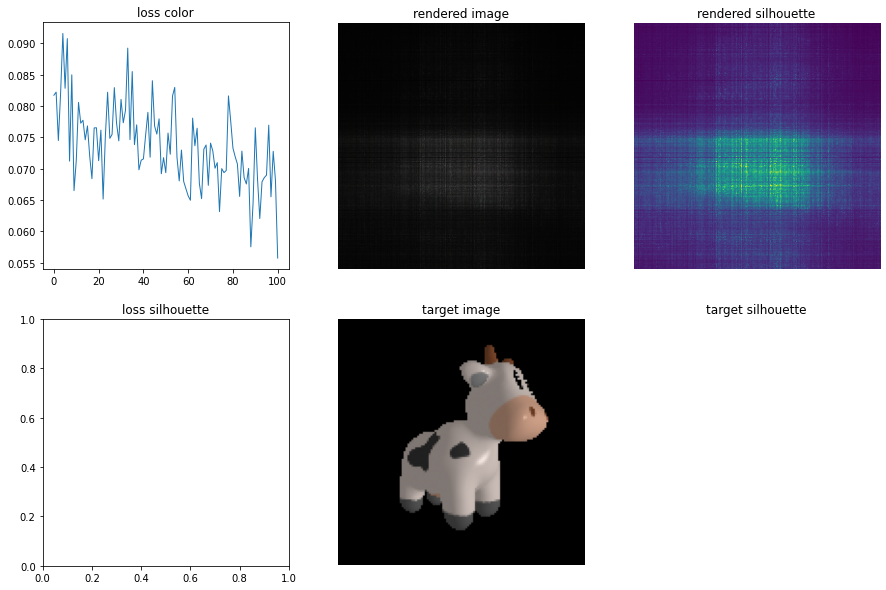

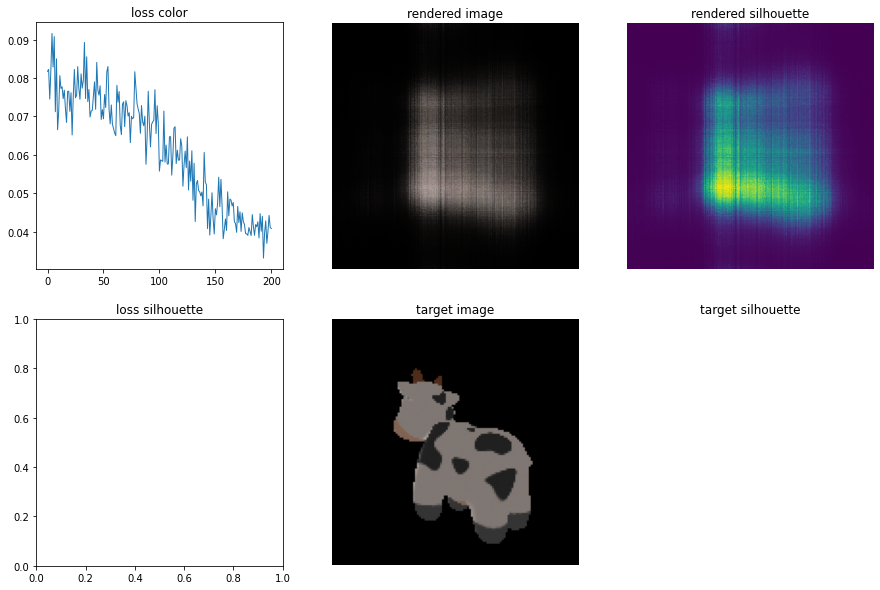

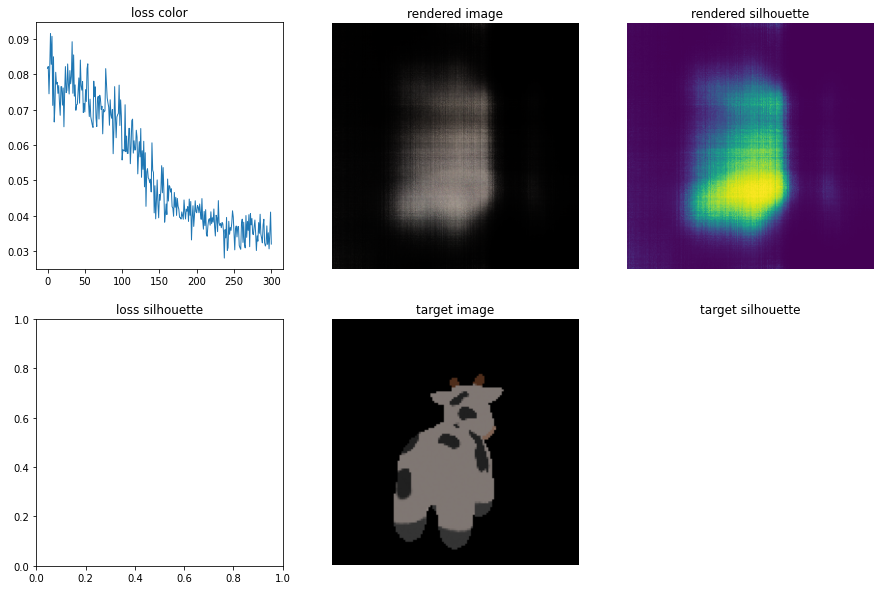

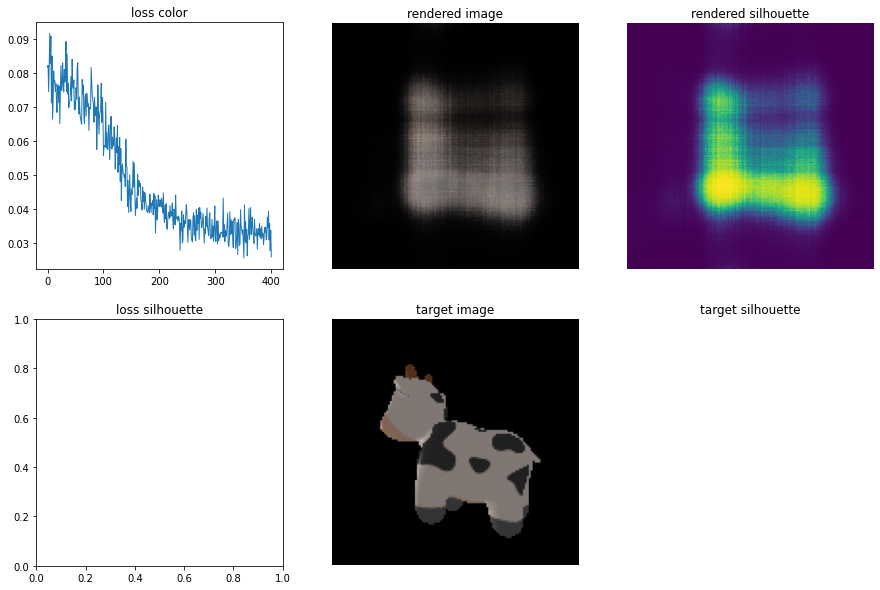

...

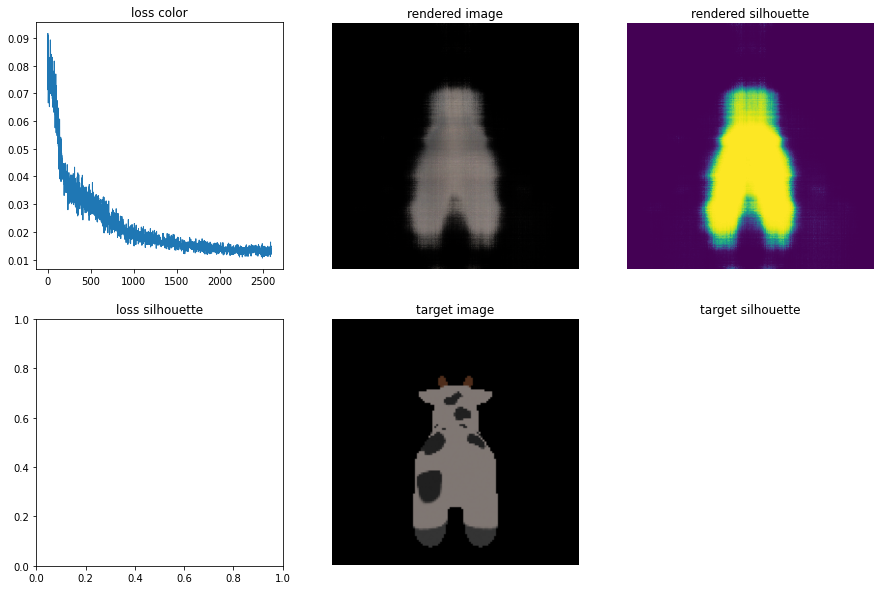

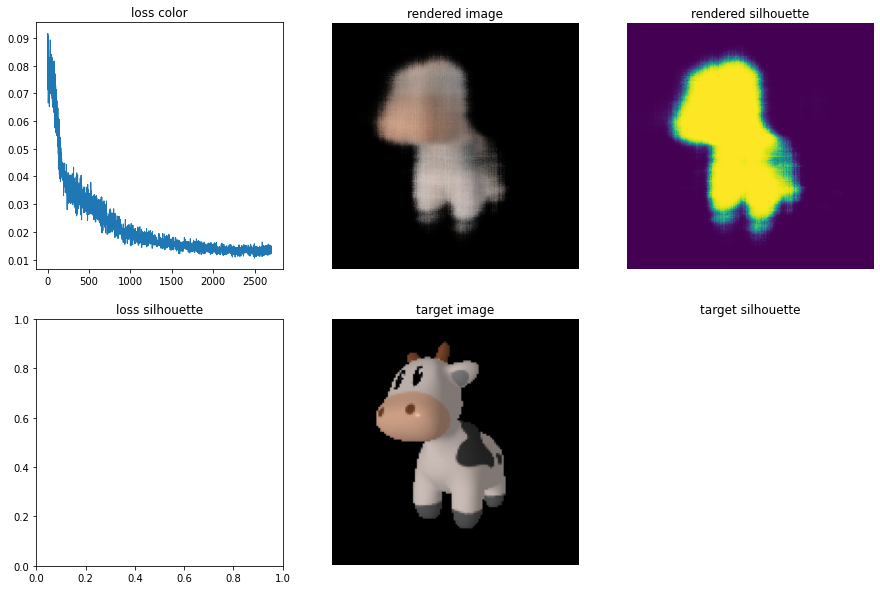

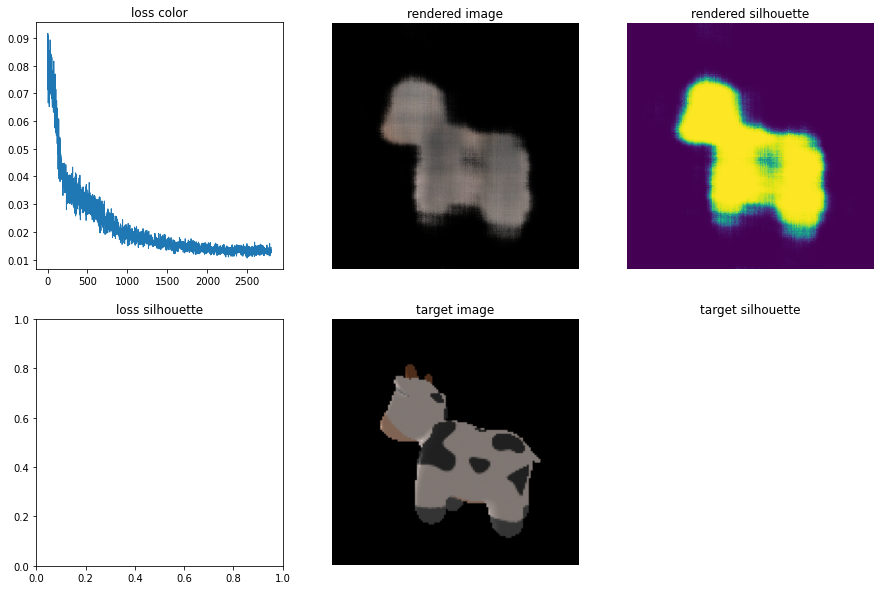

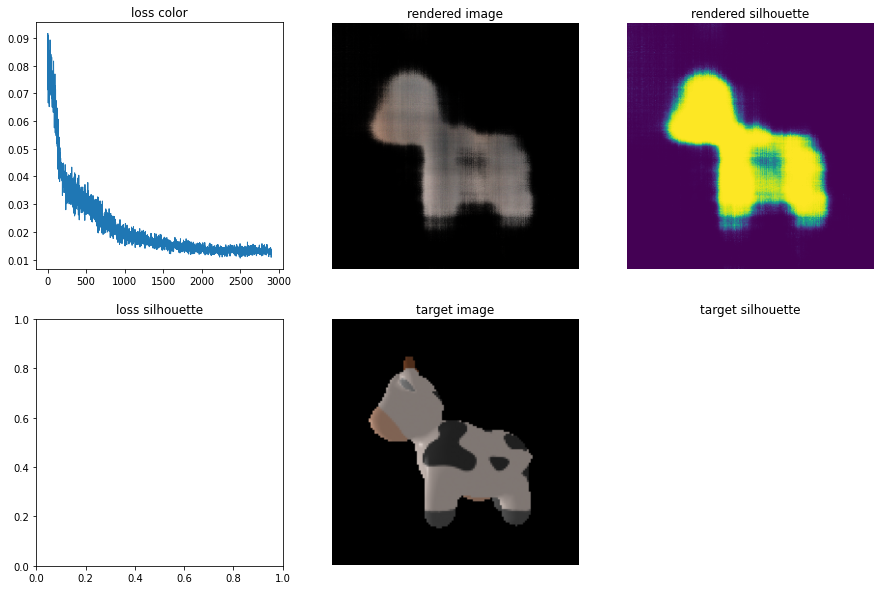

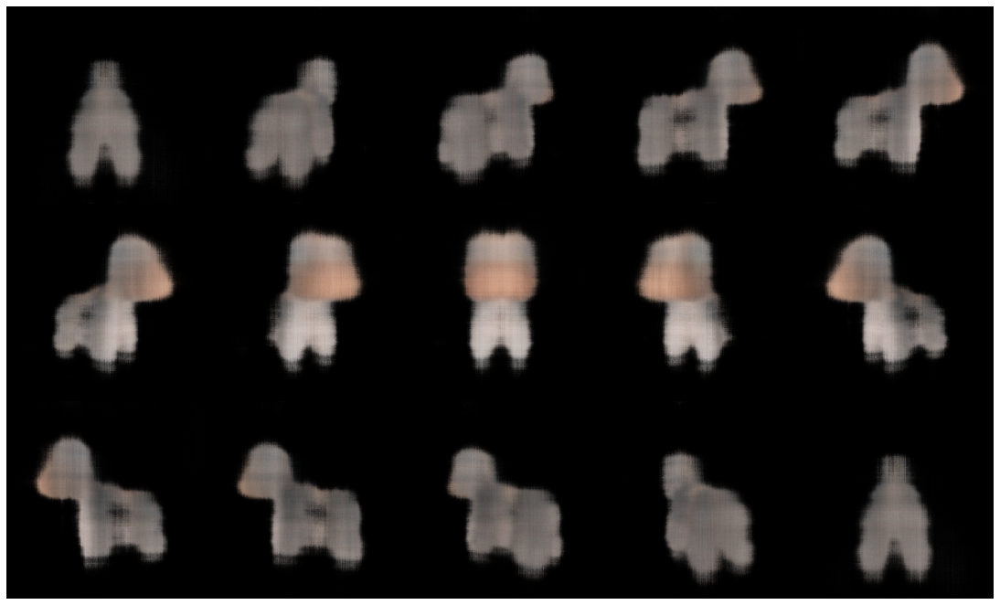

In [ ]:
def _experiment():
  harmonic_nerf = HarmonicNeRF(60).to(device)
  optimize_radiance_field(harmonic_nerf)

  with torch.no_grad():
    generate_rotating_nerf(harmonic_nerf, n_frames=3*5)

  del harmonic_nerf

_experiment()

## Task e)

If you are feeling lucky, you can try and run your code on a more challenging example. In the provided archive drums.zip you can find a downsampled version of one of the test scenes from [1]. Here your view-dependence should come in handy, as the scene contains some prominent metallic reflections. There is also a separate test set to validate your results on unseen views. Provided along side the images are silhouettes that can help you optimize the density of the neural representation. You can do this by adding a silhouette loss, which  is simply the Huber loss between the target silhouette and the opacity output of the ImplicitRenderer. You can also find the in this original PyTorch3D tutorial.

# Part 3 - Bundle Adjustment

In the last part, we want to focus on a weakness of the original NeRF approach: It requires accurate camera poses to be able to create a meaningful volumetric representation. One way to correct imperfect camera poses in this setting has been proposed by Lin et al. [3]. Their contribution consists of two steps:

1. Adding the camera poses as parameters to the optimization process. They can be optimized by simply backpropagating the existing color & density errors.
2. Dynamically weighting the positional encoding, such that in early training steps the low-frequency components dominate to help optimizing camera poses and then gradually introducing higher frequencies to optimize the visual fidelity.
If you want to save some time, you can find functions to visualize cameras in the 3D scene in the tutorials folder of the PyTorch3D repository.

## Task a)

If you have not done so already, add a silhouette loss as mentioned in Part 2e. You can find the silhouettes for the cow scene in cow silhouettes.zip.

In [ ]:
def optimize_radiance_field_silhouette(neural_radiance_field, verbose = True):
  # First move all relevant variables to the correct device.
  global renderer_grid, renderer_mc, target_cameras
  global target_images, target_silhouettes
  renderer_grid = renderer_grid.to(device)
  renderer_mc = renderer_mc.to(device)
  target_cameras = target_cameras.to(device)
  target_images = target_images.to(device)
  target_silhouettes = target_silhouettes.to(device)

  # Set the seed for reproducibility
  torch.manual_seed(1)

  # We sample 6 random cameras in a minibatch. Each camera
  # emits raysampler_mc.n_pts_per_image rays.
  batch_size = 6

  # 3000 iterations take ~20 min on a Tesla M40 and lead to
  # reasonably sharp results. However, for the best possible
  # results, we recommend setting n_iter=20000.
  n_iter = 3000

  # Instantiate the Adam optimizer. We set its master learning rate to 1e-3.
  lr = 1e-4
  optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)
  scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=int(0.75*n_iter), gamma=0.1)

  # Init the loss history buffers.
  color_loss_history = []
  sil_loss_history = []

  # The main optimization loop.
  start = time.time()
  for iteration in range(n_iter):
    # In case we reached the last 75% of iterations,
    # decrease the learning rate of the optimizer 10-fold.
    if iteration == round(n_iter * 0.75):
        print('Decreasing LR 10-fold ...')
        optimizer = torch.optim.Adam(
            neural_radiance_field.parameters(), lr=lr * 0.1
        )

    # Zero the optimizer gradient.
    optimizer.zero_grad()

    # Sample random batch indices.
    batch_idx = torch.randperm(len(target_cameras))[:batch_size]

    # Sample the minibatch of cameras.
    batch_cameras = FoVPerspectiveCameras(
        R = target_cameras.R[batch_idx],
        T = target_cameras.T[batch_idx],
        znear = target_cameras.znear[batch_idx],
        zfar = target_cameras.zfar[batch_idx],
        aspect_ratio = target_cameras.aspect_ratio[batch_idx],
        fov = target_cameras.fov[batch_idx],
        device = device,
    )

    # Evaluate the nerf model.
    rendered_images_silhouettes, sampled_rays = renderer_mc(
        cameras=batch_cameras,
        volumetric_function=neural_radiance_field
    )
    rendered_images, rendered_silhouettes = (
        rendered_images_silhouettes.split([3, 1], dim=-1)
    )

    # Compute the silhouette error as the mean huber
    # loss between the predicted masks and the
    # sampled target silhouettes.
    silhouettes_at_rays = sample_images_at_mc_locs(
        target_silhouettes[batch_idx, ..., None],
        sampled_rays.xys
    )
    sil_loss = huber(
        rendered_silhouettes,
        silhouettes_at_rays,
    ).abs().mean()

    # Compute the color error as the mean huber
    # loss between the rendered colors and the
    # sampled target images.
    colors_at_rays = sample_images_at_mc_locs(
        target_images[batch_idx],
        sampled_rays.xys
    )
    color_loss = huber(
        rendered_images,
        colors_at_rays,
    ).abs().mean()

    # Compute combined loss
    loss = color_loss + sil_loss

    # Take the optimization step.
    loss.backward()
    optimizer.step()

    # Log the loss history.
    color_loss_history.append(color_loss.item())
    sil_loss_history.append(sil_loss.item())

    # Every 10 iterations, print the current values of the losses.
    if iteration % 10 == 0 and verbose:
        print(
            f'Iteration {iteration:05d}:'
            + f' loss color = {color_loss.item():1.2e}'
            + f' loss silhouette = {sil_loss.item():1.2e}'
        )

    # Visualize the full renders every 100 iterations.
    if iteration % 100 == 0 and verbose:
        show_idx = torch.randperm(len(target_cameras))[:1]
        show_full_render(
            neural_radiance_field,
            FoVPerspectiveCameras(
                R = target_cameras.R[show_idx],
                T = target_cameras.T[show_idx],
                znear = target_cameras.znear[show_idx],
                zfar = target_cameras.zfar[show_idx],
                aspect_ratio = target_cameras.aspect_ratio[show_idx],
                fov = target_cameras.fov[show_idx],
                device = device,
            ),
            target_images[show_idx][0],
            target_silhouettes[show_idx][0],
            color_loss_history,
            sil_loss_history,
        )

  end = time.time()
  print(f"NeRF optimization finished in {end - start} seconds")


## Task b)
Load images, silhouettes and cameras of the “cow” scene. If you got some good results for it, you can also use the “drums” scene.

In [ ]:
with open('cow/silhouettes.pkl', 'rb') as input:
    target_silhouettes = pickle.load(input)

## Task c)
As we use synthetic scenes, the camera poses are spot-on. Therefore we have to create some deviations ourselves. Perturb both position and rotation of the loaded cameras by a small amount. Make sure that the resulting rotation matrices R are still orthogonal. You can impose this by either applying a small rotation or finding the “nearest orthogonal matrix” using an SVD. Visualize the original and perturbed poses, e.g. by using the aforementioned PyTorch3D functions.

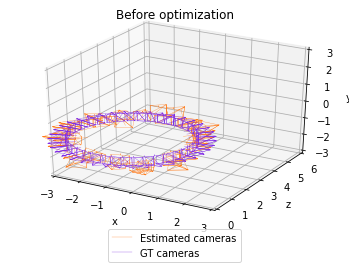

In [ ]:
from camera_visualization import plot_camera_scene

def nearest_orthogonal(M):
  U, S, Vh = torch.linalg.svd(M, full_matrices=True)
  return U @ Vh

input_cameras = target_cameras.clone()
perturbed_T = 0.15*torch.randn(input_cameras.T.shape, device=device)
input_cameras.T = target_cameras.T + perturbed_T
pertrubed_R = 0.15*torch.randn(input_cameras.R.shape, device=device)
input_cameras.R = nearest_orthogonal(target_cameras.R + pertrubed_R)

plot_camera_scene(input_cameras, target_cameras, "Before optimization")
plt.show()

## Task d)
Add weighting to the positional encoding like shown in formula (14) in [3]. Make sure that you add α as parameter to your encoding that you can adjust as the training goes on. In case you are using a different frequency scheme than $\gamma$ from Part 2, make sure you apply the weighting such that frequencies are introduced in the correct order (compare Part 2c).

In [ ]:
class WeightedEmbedding(torch.nn.Module):

  def __init__(self, harmonic_dim=60, omega0=0.1):

    super().__init__()
    self.harmonic_dim = harmonic_dim

    self.register_buffer(
            'frequencies',
            omega0 * (2.0 ** torch.arange(harmonic_dim)),
    )

    self.register_buffer(
            'weights',
            torch.zeros_like(self.frequencies),
    )

  @torch.no_grad()
  def updateWeights(self, alpha):
    k = math.floor(alpha-1)+1
    self.weights[:k] = 1
    if k < self.harmonic_dim:
      self.weights[k] = 0.5*(1-math.cos((alpha-k)*math.pi))

  def forward(self, x):
    embed = (x[..., None] * self.frequencies)
    embeded = torch.cat(
        (x.unsqueeze(-1), self.weights*embed.sin(), self.weights*embed.cos()),
        dim=-1
    )
    return embeded.view(*x.shape[:-1], -1)

class WeightedEncoding(DirectionalEncoding):

  def __init__(self, harmonic_dim):
    super().__init__(harmonic_dim)

    self.harmonic_embedding = WeightedEmbedding(harmonic_dim)

  def updateWeights(self, alpha):
    self.harmonic_embedding.updateWeights(alpha)

class BundleAdjustNeRF(HarmonicNeRF):

  def __init__(self, harmonic_dim, hidden_dim=256):
    super().__init__(harmonic_dim, hidden_dim)

    self.encoding = WeightedEncoding(harmonic_dim)
    embedding_dim = 6* harmonic_dim + 3

    self.mlp = torch.nn.Sequential(
          WeightedEmbedding(harmonic_dim),
          torch.nn.Linear(embedding_dim, hidden_dim),
          torch.nn.Softplus(beta=10.0),
          torch.nn.Linear(hidden_dim, hidden_dim),
          torch.nn.Softplus(beta=10.0)
    )

    self.color_layer = torch.nn.Sequential(
      torch.nn.Linear(hidden_dim + embedding_dim, hidden_dim),
      torch.nn.Softplus(beta=10.0),
      torch.nn.Linear(hidden_dim, 3),
      torch.nn.Sigmoid(),
    )

  def updateEmbeddingWeights(self, alpha):
    self.mlp[0].updateWeights(alpha)
    self.encoding.updateWeights(alpha)

## Task e & f)
Create a separate Adam optimizer for the camera poses with a learning rate of 10−3.
The authors recommend an exponential learning rate decay from 10−3 to 10−5, which can be implemented using `torch.optim.lr scheduler.ExponentialLR` and a decay factor gamma=0.9977 if you train for 2000 epochs. You can find out more about how to use scheduling in the PyTorch documentation.

In the training loop,

*     add the optimizer (and the scheduler) from (e),
*     add the adjustment of α from (d) after each iteration, and
*     make sure that the rotation matrices are orthogonal after the optimizer update,

e.g. by using the SVD trick from (c).

In [ ]:
def optimize_bundle_adjust(neural_radiance_field, n_harmonic_functions, optimized_cameras, verbose = True):
  global renderer_grid, renderer_mc
  global target_cameras, target_images, target_silhouettes
  # First move all relevant variables to the correct device.
  renderer_grid = renderer_grid.to(device)
  renderer_mc = renderer_mc.to(device)
  target_cameras = target_cameras.to(device)
  target_images = target_images.to(device)
  target_silhouettes = target_silhouettes.to(device)

  # Set the seed for reproducibility
  torch.manual_seed(1)

  # We sample 10 random cameras in a minibatch. Each camera
  # emits raysampler_mc.n_pts_per_image rays.
  batch_size = 5

  # 3000 iterations take ~20 min on a Tesla M40 and lead to
  # reasonably sharp results. However, for the best possible
  # results, we recommend setting n_iter=20000.
  n_iter = 2000

  # Define alpha values used during the optimization
  alpha_start = 400
  alpha_end = 800
  alphas = torch.zeros(n_iter)
  alphas[alpha_start:alpha_end] = n_harmonic_functions/(alpha_end - alpha_start)
  alphas = torch.cumsum(alphas, dim=-1)

  # Instantiate the radiance field model.
  #neural_radiance_field = NeuralRadianceField(n_harmonic_functions).to(device)

  # Instantiate two Adam optimizer for the neural radiance field and the camera pose
  # We set the nerf master learning rate to 1e-3 and the pose learning rate to 1e-3
  lr = 1e-3
  optimizer = torch.optim.Adam(neural_radiance_field.parameters(), lr=lr)
  pose_optimizer = torch.optim.Adam(
      [optimized_cameras.T.requires_grad_(),
      optimized_cameras.R.requires_grad_()],
      lr=0.001
  )
  pose_scheduler = torch.optim.lr_scheduler.ExponentialLR(pose_optimizer, gamma=0.9977)

  # Init the loss history buffers.
  loss_history_color, loss_history_sil = [], []

  # The main optimization loop.
  start = time.time()
  for iteration in range(n_iter):
      # In case we reached the last 75% of iterations,
      # decrease the learning rate of the optimizer 10-fold.
      if iteration == round(n_iter * 0.75):
          print('Decreasing LR 10-fold ...')
          optimizer = torch.optim.Adam(
              neural_radiance_field.parameters(), lr=lr * 0.1
          )

      # Sample random batch indices.
      randperm = torch.randperm(len(target_cameras))

      for batch in range(len(target_cameras)//batch_size):
        batch_idx = randperm[batch*batch_size:(batch+1)*batch_size]

        # Zero the optimizer gradient.
        optimizer.zero_grad()
        pose_optimizer.zero_grad()


        # Sample the minibatch of cameras.
        batch_cameras = FoVPerspectiveCameras(
            R = optimized_cameras.R[batch_idx],
            T = optimized_cameras.T[batch_idx],
            znear = optimized_cameras.znear[batch_idx],
            zfar = optimized_cameras.zfar[batch_idx],
            aspect_ratio = optimized_cameras.aspect_ratio[batch_idx],
            fov = optimized_cameras.fov[batch_idx],
            device = device,
        )

        # Evaluate the nerf model.
        rendered_images_silhouettes, sampled_rays = renderer_mc(
            cameras=batch_cameras,
            volumetric_function=neural_radiance_field
        )
        rendered_images, rendered_silhouettes = (
            rendered_images_silhouettes.split([3, 1], dim=-1)
        )

        # Compute the silhouette error as the mean huber
        # loss between the predicted masks and the
        # sampled target silhouettes.
        silhouettes_at_rays = sample_images_at_mc_locs(
            target_silhouettes[batch_idx, ..., None],
            sampled_rays.xys
        )
        sil_err = huber(
            rendered_silhouettes,
            silhouettes_at_rays,
        ).abs().mean()

        # Compute the color error as the mean huber
        # loss between the rendered colors and the
        # sampled target images.
        colors_at_rays = sample_images_at_mc_locs(
            target_images[batch_idx],
            sampled_rays.xys
        )
        color_err = huber(
            rendered_images,
            colors_at_rays,
        ).abs().mean()

        # The optimization loss is a simple
        # sum of the color and silhouette errors.
        loss = color_err + sil_err

        # Log the loss history.
        loss_history_color.append(float(color_err))
        loss_history_sil.append(float(sil_err))

        # Take the optimization step.
        loss.backward()
        optimizer.step()
        pose_optimizer.step()

      # Update the embedding weights
      alpha = alphas[iteration]
      neural_radiance_field.updateEmbeddingWeights(alpha.item())

      # Ensure that the rotational matricies are orthogonal
      with torch.no_grad():
        rotation = nearest_orthogonal(optimized_cameras.R)
        optimized_cameras.R.set_(rotation)

      # Update the learning rates
      pose_scheduler.step()

      # Every 10 iterations, print the current values of the losses.
      if iteration % 10 == 0:
          print(
              f'Iteration {iteration:05d}:'
              + f' loss color = {float(color_err):1.2e}'
              + f' loss silhouette = {float(sil_err):1.2e}'
          )

      # Visualize the full renders every 100 iterations.
      if iteration % 100 == 0 and verbose:
          show_idx = torch.randperm(len(optimized_cameras))[:1]
          show_full_render(
              neural_radiance_field,
              FoVPerspectiveCameras(
                  R = optimized_cameras.R[show_idx],
                  T = optimized_cameras.T[show_idx],
                  znear = optimized_cameras.znear[show_idx],
                  zfar = optimized_cameras.zfar[show_idx],
                  aspect_ratio = optimized_cameras.aspect_ratio[show_idx],
                  fov = optimized_cameras.fov[show_idx],
                  device = device,
              ),
              target_images[show_idx][0],
              target_silhouettes[show_idx][0],
              loss_history_color,
              loss_history_sil,
          )

  end = time.time()
  print(f"BaRF optimization finished in {end - start} seconds")

# Task g)

Run the training and visualize both the original (unperturbed) and the optimized
poses. Did the pose estimation work?

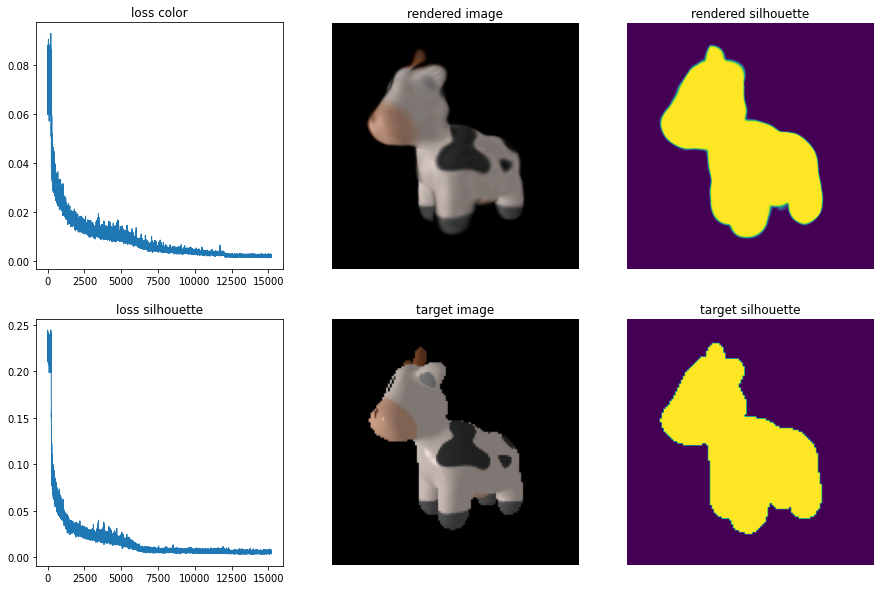

Iteration 01910: loss color = 2.43e-03 loss silhouette = 7.05e-03
Iteration 01920: loss color = 2.15e-03 loss silhouette = 4.83e-03
Iteration 01930: loss color = 2.15e-03 loss silhouette = 4.40e-03
Iteration 01940: loss color = 2.42e-03 loss silhouette = 5.88e-03
Iteration 01950: loss color = 2.45e-03 loss silhouette = 6.59e-03
Iteration 01960: loss color = 1.86e-03 loss silhouette = 4.62e-03
Iteration 01970: loss color = 2.05e-03 loss silhouette = 5.41e-03
Iteration 01980: loss color = 2.15e-03 loss silhouette = 7.07e-03
Iteration 01990: loss color = 2.60e-03 loss silhouette = 5.10e-03
BaRF optimization finished in 3956.6251792907715 seconds
Rendering rotating NeRF ...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



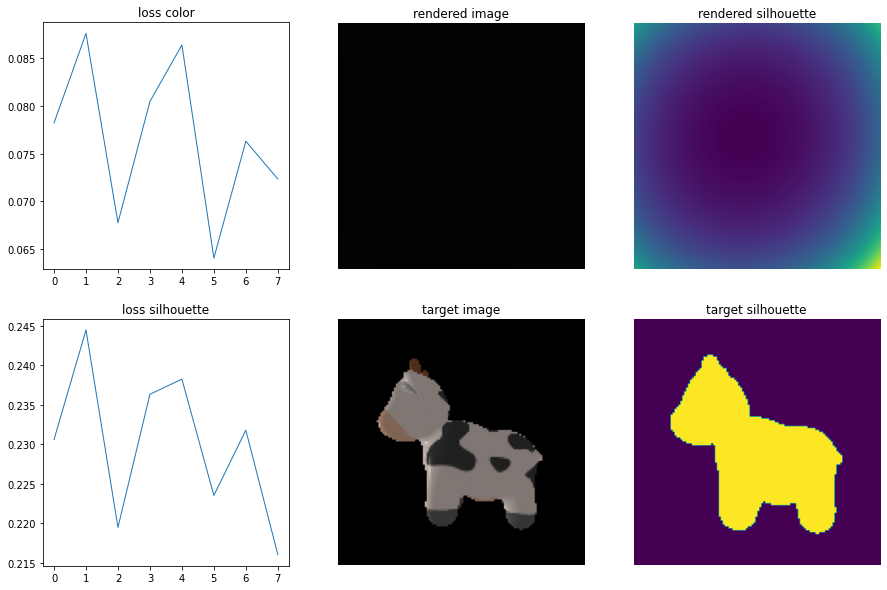

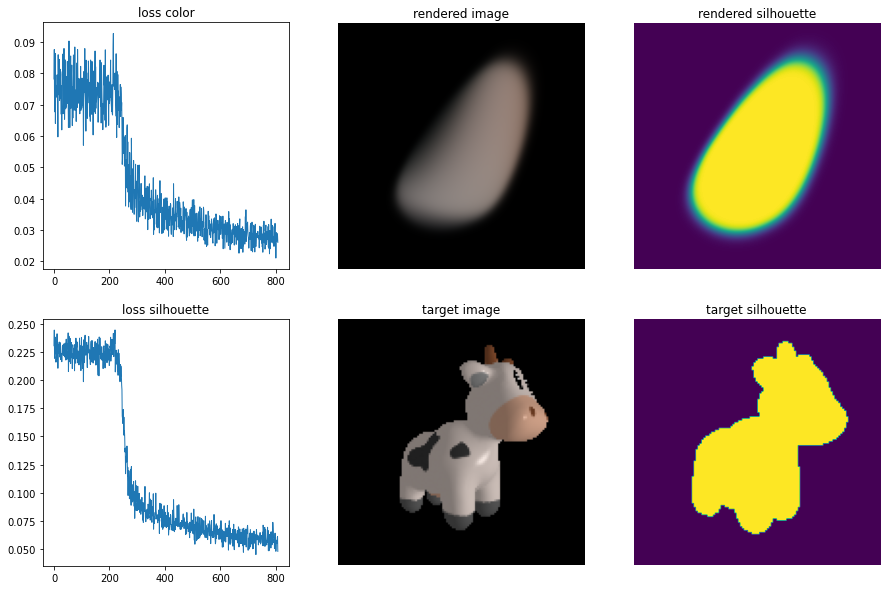

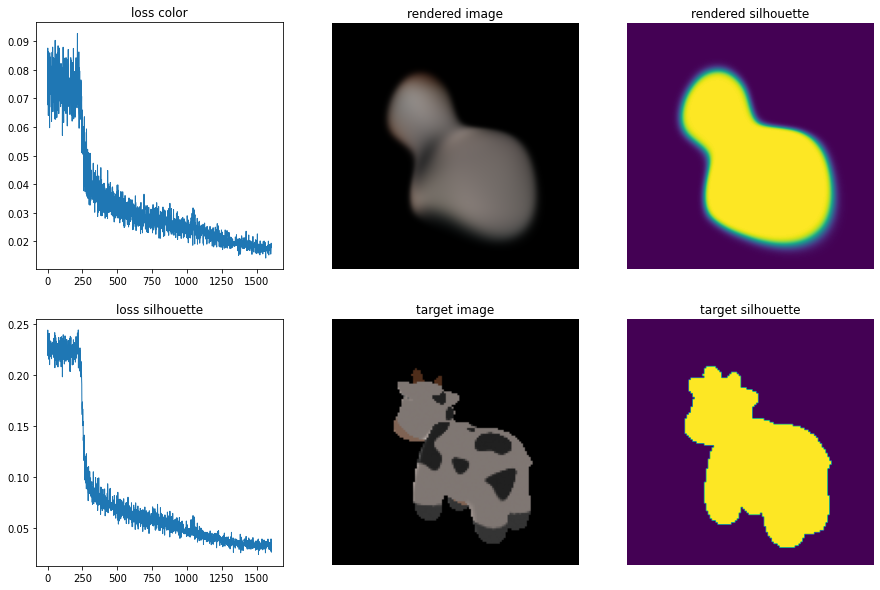

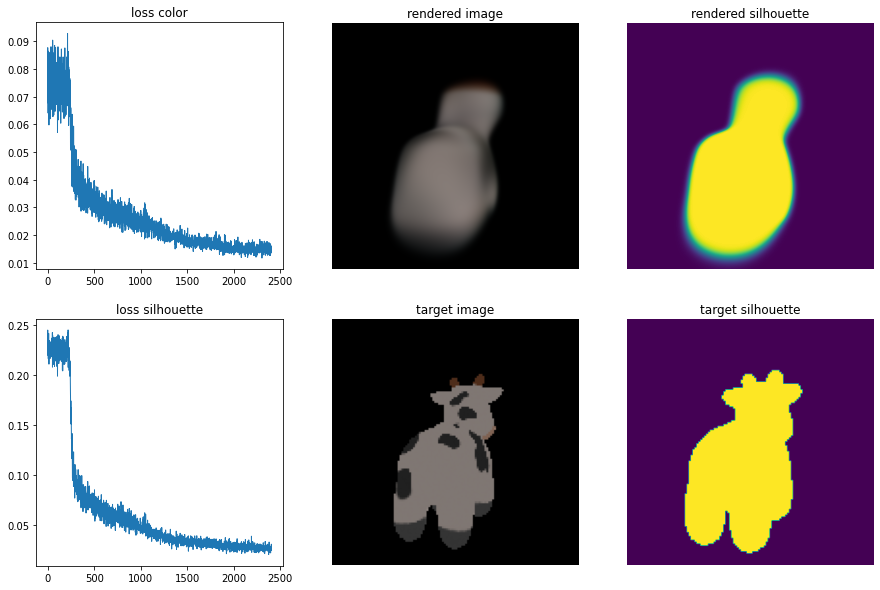

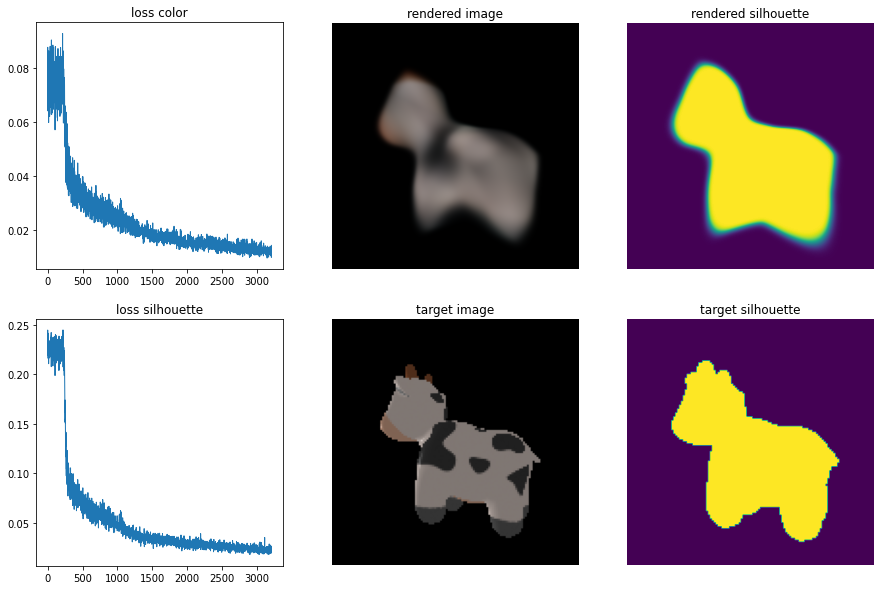

...

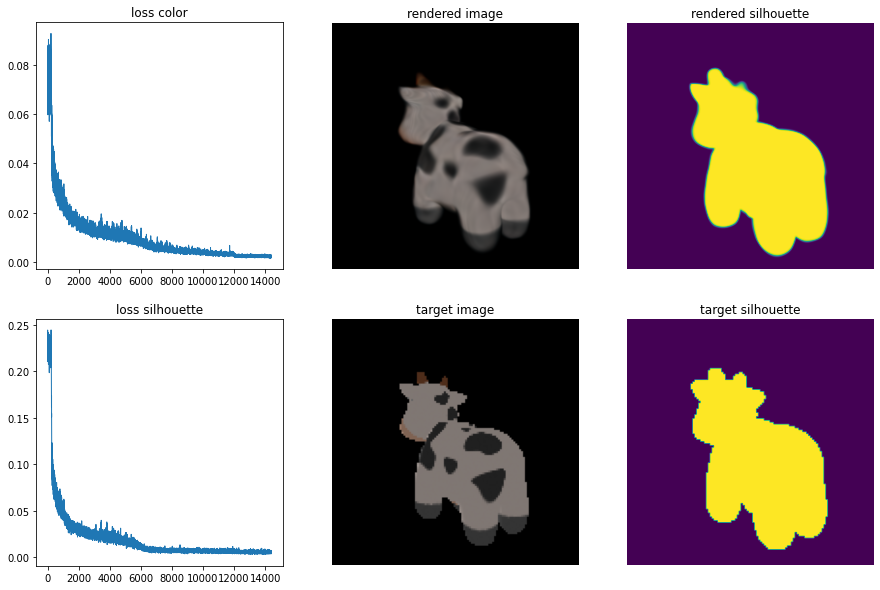

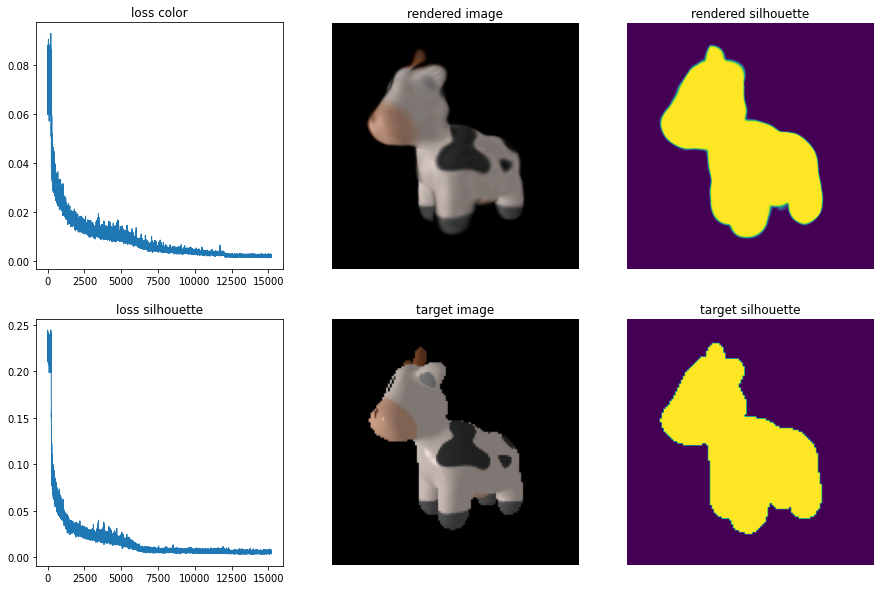

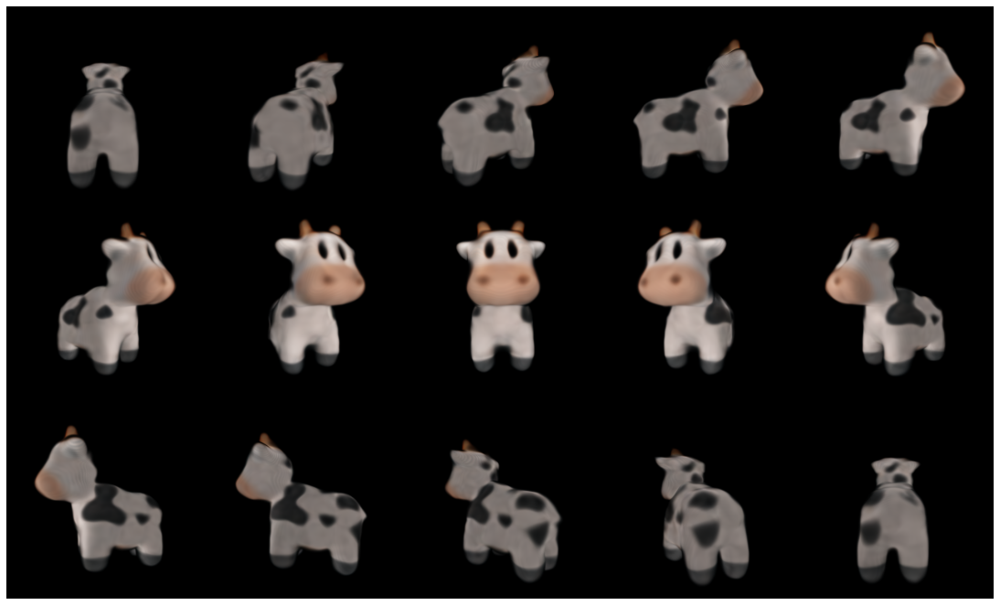

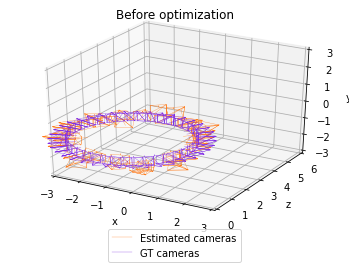

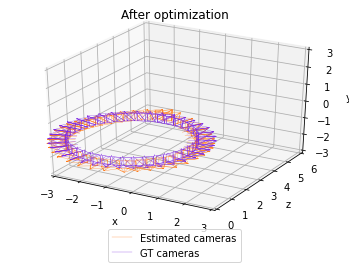

In [ ]:
def _experiment():
  bundle_nerf = BundleAdjustNeRF(8).to(device)

  # Clone the input cameras to allow for comparisson afterwards
  optimized_cameras = input_cameras.clone()
  optimized_cameras.T = input_cameras.T.clone()
  optimized_cameras.R = input_cameras.R.clone()

  optimize_bundle_adjust(bundle_nerf, 8, optimized_cameras)

  with torch.no_grad():
    generate_rotating_nerf(bundle_nerf, n_frames=3*5)
    plot_camera_scene(input_cameras, target_cameras, "Before optimization")
    plot_camera_scene(optimized_cameras, target_cameras, "After optimization")
    plt.show()

  del bundle_nerf
  del optimized_cameras

_experiment()